This file was doing doing clustering of the bin2cell results and then using the SCRNA to transfer the labels on to the clustering to see the if the clusters were well defined with labels. 

In [1]:
import scanpy as sc
import torch
import anndata as ad
import pandas as pd
import bbknn
import scanpy.external as sce
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import anndata

/nfs/home/jjoseph/.local/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2025-07-30 10:35:59.841250: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F AVX512_VNNI AVX512_BF16 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-07-30 10:35:59.958226: I tensorflow/core/util/util.cc:169] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-30 10:35:59.982429: E tensorflow/stream_executor/cuda/cuda_blas.c

In [2]:
print("CUDA available:", torch.cuda.is_available())
if torch.cuda.is_available():
        print("Device name:", torch.cuda.get_device_name(0))

CUDA available: True
Device name: NVIDIA L40S


In [3]:
# Bin2Cell P2 and P5 
import celltypist
#Bin2Cell 
p2_adata_bin2cell = sc.read_h5ad("/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/P2CRC/P2CRC_b2c_cells.h5ad")
p5_adata_bin2cell = sc.read_h5ad("/gpfs/commons/groups/innovation/jjoseph/bin2cell_results/P5CRC/P5CRC_b2c_cells.h5ad")

Bin2Cell P2 Leiden and Single Cell Integration

In [10]:
import scanpy as sc

# Start with your full spatial data
adata_p2 = p2_adata_bin2cell.copy()

# Preprocess
sc.pp.normalize_total(adata_p2)
sc.pp.log1p(adata_p2)

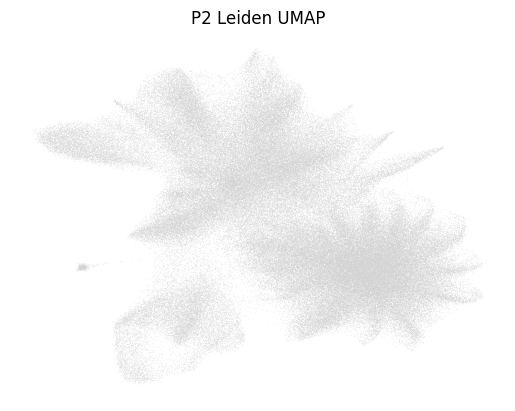

In [11]:
# Downstream analysis
sc.pp.highly_variable_genes(adata_p2, n_top_genes=2000)
adata_p2 = adata_p2[:, adata_p2.var.highly_variable].copy()

sc.pp.scale(adata_p2, max_value=10)
sc.tl.pca(adata_p2)
sc.pp.neighbors(adata_p2)
sc.tl.umap(adata_p2)

sc.pl.umap(adata_p2, title="P2 Leiden UMAP", frameon=False)

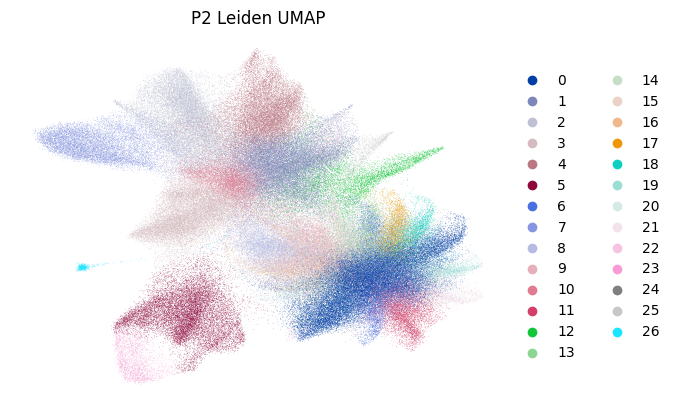

In [13]:
sc.tl.leiden(adata_p2)
sc.pl.umap(adata_p2, color="leiden", title="P2 Leiden UMAP", frameon=False)

In [30]:
import os

# Create the folder if it doesn't exist
os.makedirs("07_30_clustering", exist_ok=True)

# Save the AnnData object to the new folder
p5_adata.write("07_30_clustering/p5_leiden_clustered.h5ad")
combined_p5.write("07_30_clustering/combined_p5_harmony_knn_labeled.h5ad")

... storing 'predicted_ClusterFull' as categorical
... storing 'predicted_ClusterTop' as categorical
... storing 'predicted_ClusterMidway' as categorical


AnnData object with n_obs × n_vars = 590650 × 611
    obs: 'biosample_id', 'donor_id', 'SpecimenType', 'TissueSource', 'ProcessingMethod', 'PatientTypeID', 'sex', 'Site', 'Grade', 'TumorStage', 'LymphNodeStatus', 'MMRStatusTumor', 'MMRMLH1Tumor', 'qc_geneCount', 'qc_logMappedReads', 'qc_meanReadsPerUmi', 'qc_totalReads', 'qc_logUmiCount', 'qc_bcSwapFraction', 'qc_geneSatFraction', 'qc_seqDupEst', 'qc_umiSatFraction', 'qc_emptyDropPval', 'qc_mitoFraction', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'total_counts', 'log1p_total_counts', 'Sample ID', 'PhenoGraph_clusters', 'Patient', 'Primary Site', 'Sample Type', 'Treatment', 'Cell Compartment', 'PhenoGraph Classification', 'Cell State', 'P(ISC)', 'P(Squamous)', 'P(Fetal)', 'P(Absorptive)', 'P(Proliferative)', 'P(Neuroendocrine)', 'P(Secretory)', 'organoid', 'condition', 'Module Osteoblast Sco

2025-07-29 22:59:04,186 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2025-07-29 22:59:29,262 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2025-07-29 22:59:30,357 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2025-07-29 23:02:19,699 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2025-07-29 23:05:08,897 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2025-07-29 23:07:58,149 - harmonypy - INFO - Iteration 4 of 10
Iteration 4 of 10
2025-07-29 23:10:23,069 - harmonypy - INFO - Converged after 4 iterations
Converged after 4 iterations
... storing 'predicted_ClusterFull' as categorical
... storing 'predicted_ClusterTop' as categorical
... storing 'predicted_ClusterMidway' as categorical


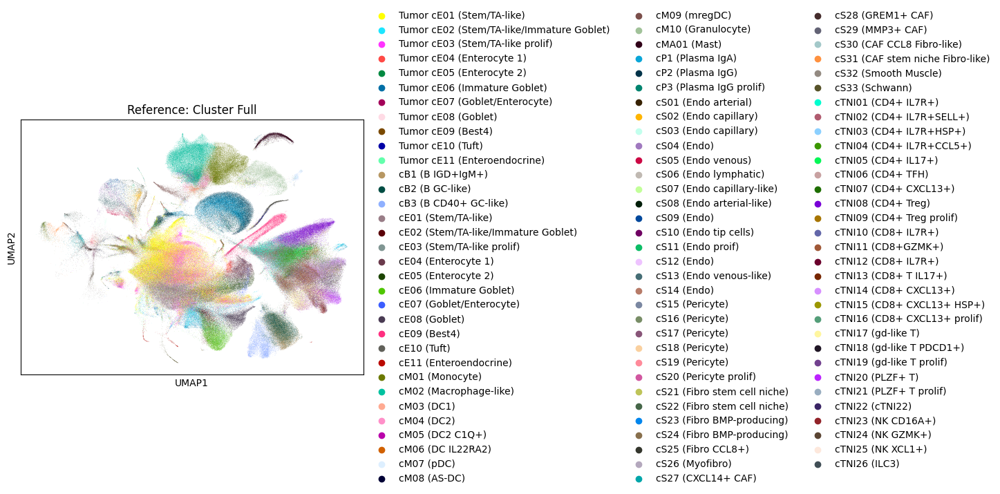

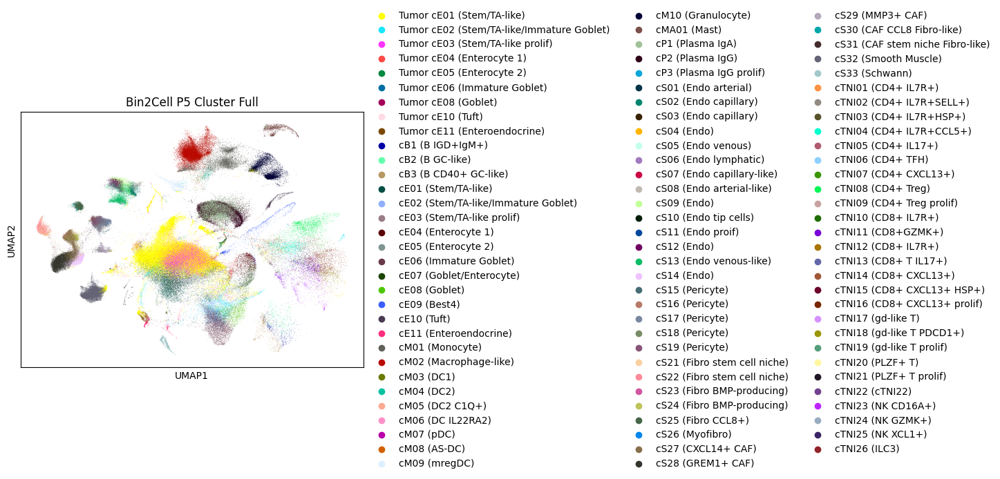

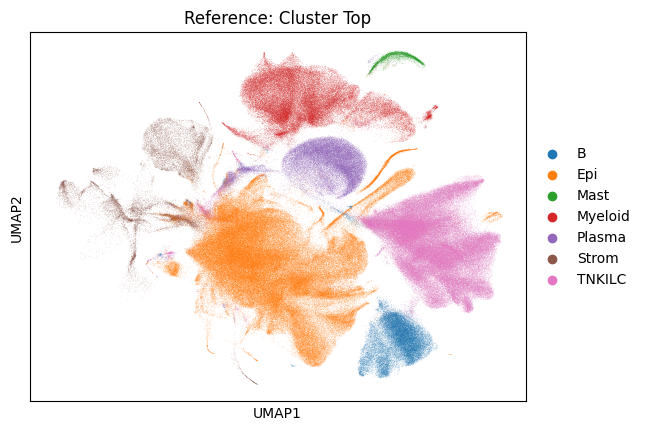

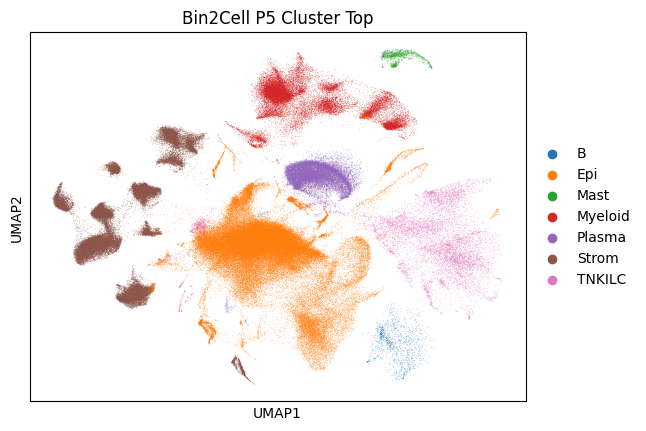

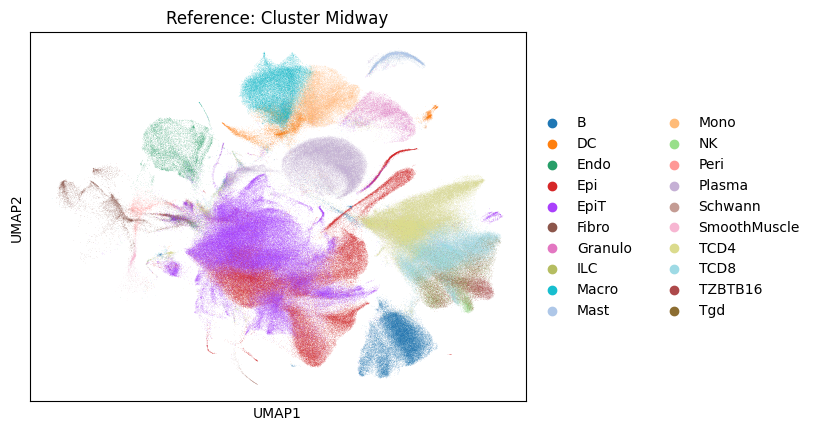

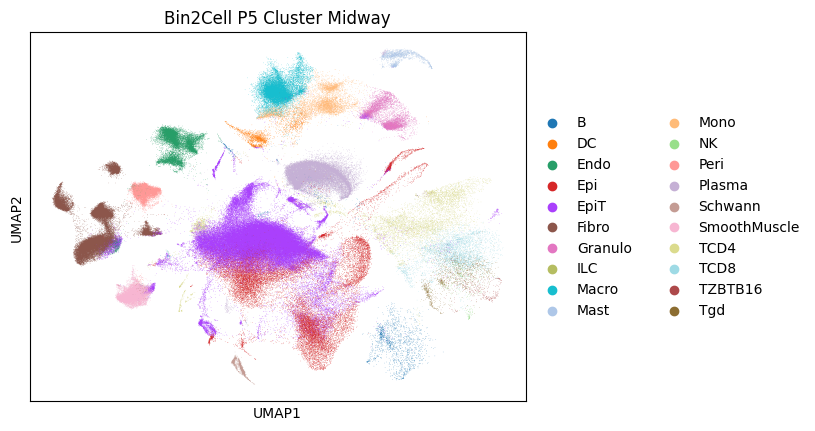

In [17]:
from sklearn.neighbors import KNeighborsClassifier  
sc_adata = sc.read_h5ad("flex_pelka_moorman_harmony_donor_integrated.h5ad")

ref   = sc_adata.copy()
print(ref)
query = p2_adata_bin2cell.copy()

# Shared HVGs
if "highly_variable" in ref.var:
    hv_mask = ref.var["highly_variable"]
elif "highly_variable_rank" in ref.var:
    hv_mask = ~ref.var["highly_variable_rank"].isna()
else:
    hv_mask = np.ones(ref.n_vars, bool)

shared_hvg = ref.var_names[hv_mask].intersection(query.var_names)
ref = ref[:, shared_hvg].copy()
query = query[:, shared_hvg].copy()

# Normalize + scale query
sc.pp.normalize_total(query)
sc.pp.log1p(query)
sc.pp.scale(query)

# Combine datasets
combined_p2 = anndata.concat(
    [ref, query],
    label="source",
    keys=["ref", "query"],
    join="outer"
)

print(combined_p2.obs["source"].value_counts())

# PCA + Harmony integration
sc.tl.pca(combined_p2, n_comps=50, svd_solver="arpack")
sc.external.pp.harmony_integrate(combined_p2, key="source")

# Neighbors + UMAP
sc.pp.neighbors(combined_p2, use_rep="X_pca_harmony")
sc.tl.umap(combined_p2)

# Masks
ref_mask = combined_p2.obs["source"] == "ref"
query_mask = combined_p2.obs["source"] == "query"

# Label transfer for multiple annotations
label_keys = ["ClusterFull", "ClusterTop", "ClusterMidway"]

for label in label_keys:
    if label not in combined_p2.obs.columns:
        print(f"Label '{label}' not found in combined_p2.obs — skipping.")
        continue

    knn = KNeighborsClassifier(n_neighbors=15)
    knn.fit(combined_p2.obsm["X_pca_harmony"][ref_mask],
            combined_p2.obs.loc[ref_mask, label])

    combined_p2.obs.loc[query_mask, f"predicted_{label}"] = knn.predict(
        combined_p2.obsm["X_pca_harmony"][query_mask]
    )

# Slice after all predictions are complete
ref_h = combined_p2[ref_mask].copy()
query_h = combined_p2[query_mask].copy()

# Plot
import os

# Plot individual UMAPs for reference and query with saving and custom titles
for label in label_keys:
    # Plot for reference
    ref_title = f"Reference: {label.replace('Cluster', 'Cluster ')}"
    ref_fig = sc.pl.umap(
        ref_h,
        color=label,
        title=ref_title,
        show=False,
        return_fig=True
    )
    ref_fig.savefig(f"figures/umap_reference_{label}.png")
    ref_fig.show()

    # Plot for Bin2Cell
    pred_label = f"predicted_{label}"
    bin2cell_title = f"Bin2Cell P5 {label.replace('Cluster', 'Cluster ')}"
    query_fig = sc.pl.umap(
        query_h,
        color=pred_label,
        title=bin2cell_title,
        show=False,
        return_fig=True
    )
    query_fig.savefig(f"figures/umap_bin2cell_P2_{label}.png")
    query_fig.show()


Bin2Cell P5 Leiden and Single Cell Integration

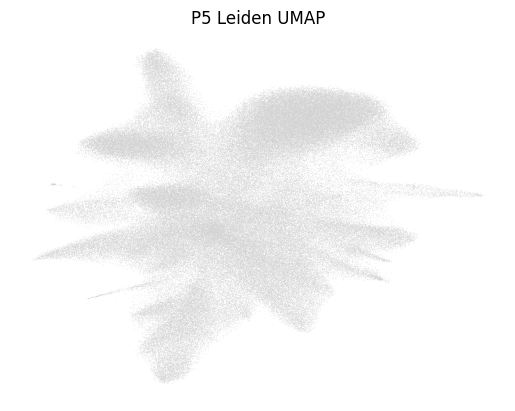

In [18]:
# Start with your full spatial data
p5_adata = p5_adata_bin2cell.copy()

# Preprocess
sc.pp.normalize_total(p5_adata)
sc.pp.log1p(p5_adata)


sc.pp.highly_variable_genes(p5_adata, n_top_genes=2000)
adata_p5 = p5_adata[:, p5_adata.var.highly_variable].copy()
sc.pp.scale(p5_adata, max_value=10)
sc.tl.pca(p5_adata)
sc.pp.neighbors(p5_adata)
sc.tl.umap(p5_adata)
sc.pl.umap(p5_adata, title="P5 Leiden UMAP", frameon=False)

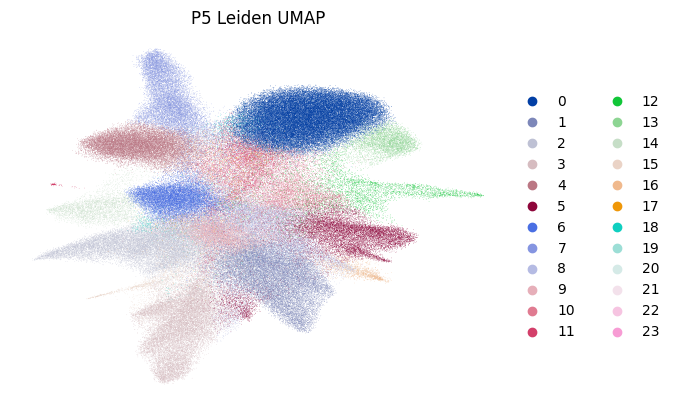

In [19]:
sc.tl.leiden(p5_adata)
sc.pl.umap(p5_adata, color="leiden", title="P5 Leiden UMAP", frameon=False)

AnnData object with n_obs × n_vars = 590650 × 611
    obs: 'biosample_id', 'donor_id', 'SpecimenType', 'TissueSource', 'ProcessingMethod', 'PatientTypeID', 'sex', 'Site', 'Grade', 'TumorStage', 'LymphNodeStatus', 'MMRStatusTumor', 'MMRMLH1Tumor', 'qc_geneCount', 'qc_logMappedReads', 'qc_meanReadsPerUmi', 'qc_totalReads', 'qc_logUmiCount', 'qc_bcSwapFraction', 'qc_geneSatFraction', 'qc_seqDupEst', 'qc_umiSatFraction', 'qc_emptyDropPval', 'qc_mitoFraction', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'total_counts', 'log1p_total_counts', 'Sample ID', 'PhenoGraph_clusters', 'Patient', 'Primary Site', 'Sample Type', 'Treatment', 'Cell Compartment', 'PhenoGraph Classification', 'Cell State', 'P(ISC)', 'P(Squamous)', 'P(Fetal)', 'P(Absorptive)', 'P(Proliferative)', 'P(Neuroendocrine)', 'P(Secretory)', 'organoid', 'condition', 'Module Osteoblast Sco

2025-07-29 23:38:58,882 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2025-07-29 23:39:21,727 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2025-07-29 23:39:22,772 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2025-07-29 23:41:43,111 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2025-07-29 23:44:03,372 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2025-07-29 23:46:23,701 - harmonypy - INFO - Iteration 4 of 10
Iteration 4 of 10
2025-07-29 23:48:44,000 - harmonypy - INFO - Converged after 4 iterations
Converged after 4 iterations
... storing 'predicted_ClusterFull' as categorical
... storing 'predicted_ClusterTop' as categorical
... storing 'predicted_ClusterMidway' as categorical


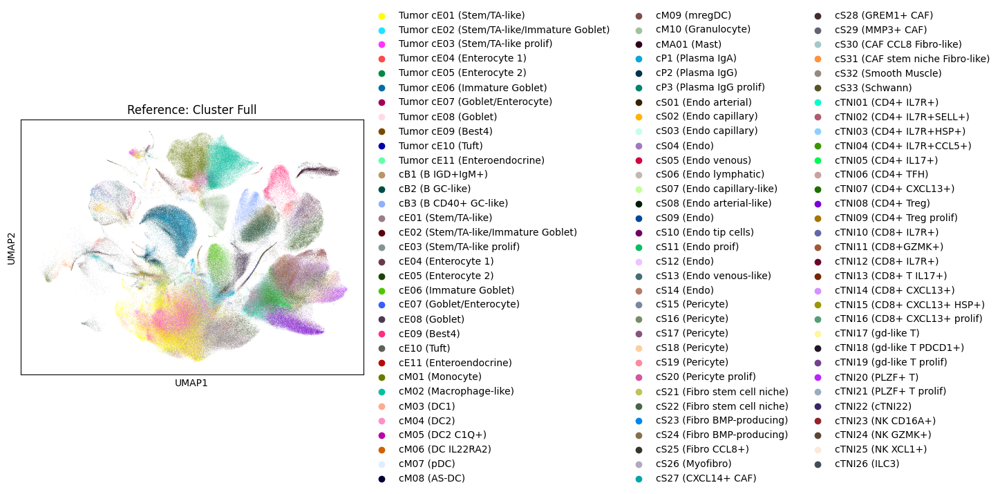

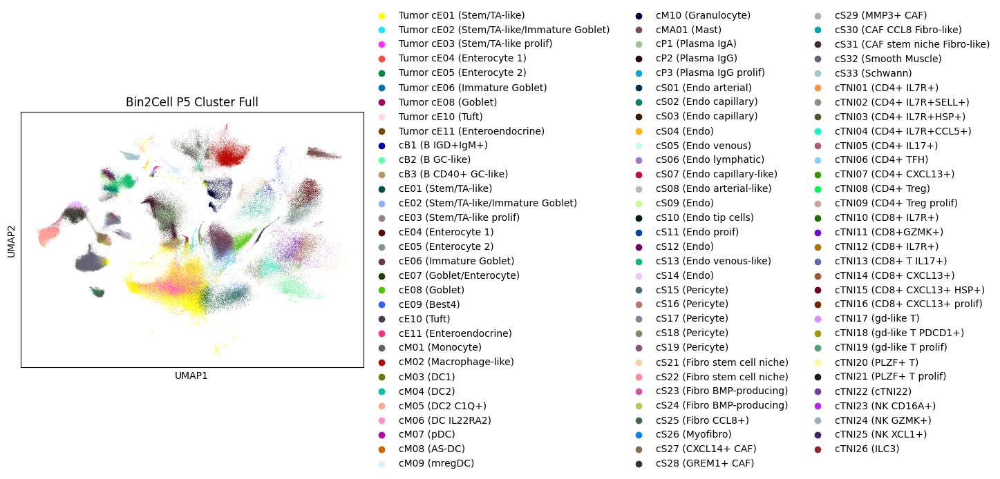

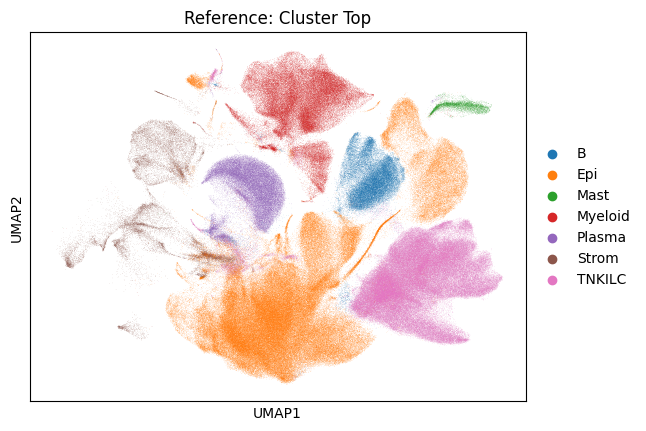

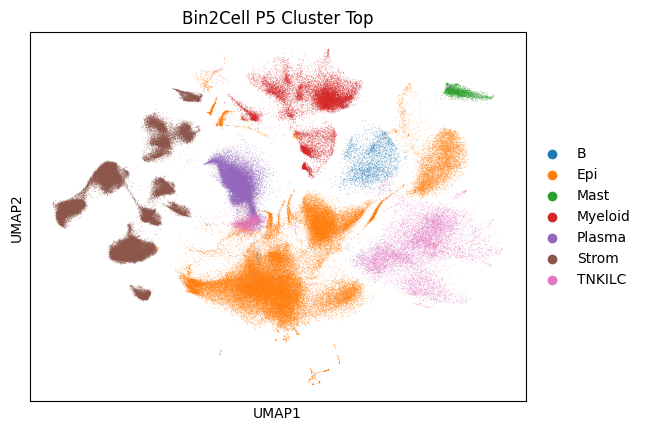

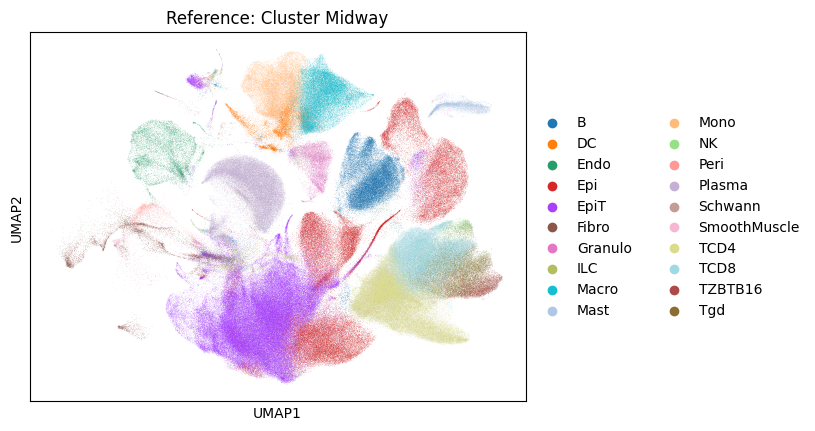

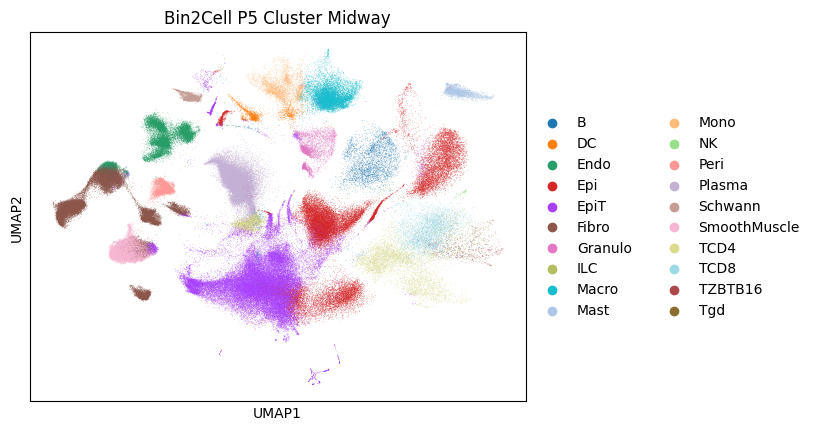

In [20]:
# Same code as before just for the different dataset p5

sc_adata = sc.read_h5ad("flex_pelka_moorman_harmony_donor_integrated.h5ad")

ref   = sc_adata.copy()
print(ref)
query = p5_adata_bin2cell.copy()

# Shared HVGs
if "highly_variable" in ref.var:
    hv_mask = ref.var["highly_variable"]
elif "highly_variable_rank" in ref.var:
    hv_mask = ~ref.var["highly_variable_rank"].isna()
else:
    hv_mask = np.ones(ref.n_vars, bool)

shared_hvg = ref.var_names[hv_mask].intersection(query.var_names)
ref = ref[:, shared_hvg].copy()
query = query[:, shared_hvg].copy()

# Normalize + scale query
sc.pp.normalize_total(query)
sc.pp.log1p(query)
sc.pp.scale(query)

# Combine datasets
combined_p5 = anndata.concat(
    [ref, query],
    label="source",
    keys=["ref", "query"],
    join="outer"
)

print(combined_p5.obs["source"].value_counts())

# PCA + Harmony integration
sc.tl.pca(combined_p5, n_comps=50, svd_solver="arpack")
sc.external.pp.harmony_integrate(combined_p5, key="source")

# Neighbors + UMAP
sc.pp.neighbors(combined_p5, use_rep="X_pca_harmony")
sc.tl.umap(combined_p5)

# Masks
ref_mask = combined_p5.obs["source"] == "ref"
query_mask = combined_p5.obs["source"] == "query"

# Label transfer for multiple annotations
label_keys = ["ClusterFull", "ClusterTop", "ClusterMidway"]

for label in label_keys:
    if label not in combined_p5.obs.columns:
        print(f"Label '{label}' not found in combined_p5.obs — skipping.")
        continue

    knn = KNeighborsClassifier(n_neighbors=15)
    knn.fit(combined_p5.obsm["X_pca_harmony"][ref_mask],
            combined_p5.obs.loc[ref_mask, label])

    combined_p5.obs.loc[query_mask, f"predicted_{label}"] = knn.predict(
        combined_p5.obsm["X_pca_harmony"][query_mask]
    )

# Slice after all predictions are complete
ref_h = combined_p5[ref_mask].copy()
query_h = combined_p5[query_mask].copy()

# Plot
import os


# Plot individual UMAPs for reference and query with saving and custom titles
for label in label_keys:
    # Plot for reference
    ref_title = f"Reference: {label.replace('Cluster', 'Cluster ')}"
    ref_fig = sc.pl.umap(
        ref_h,
        color=label,
        title=ref_title,
        show=False,
        return_fig=True
    )
    ref_fig.savefig(f"figures/umap_reference_{label}.png")
    ref_fig.show()

    # Plot for Bin2Cell
    pred_label = f"predicted_{label}"
    bin2cell_title = f"Bin2Cell P5 {label.replace('Cluster', 'Cluster ')}"
    query_fig = sc.pl.umap(
        query_h,
        color=pred_label,
        title=bin2cell_title,
        show=False,
        return_fig=True
    )
    query_fig.savefig(f"figures/umap_bin2cell_P2_{label}.png")
    query_fig.show()


In [4]:
import squidpy as sq
#Visium HD
p2_008_adata = sq.read.visium(
    path="/gpfs/commons/groups/innovation/jjoseph/data/P2_CRC/binned_outputs/square_008um",
    counts_file="filtered_feature_bc_matrix.h5",
    load_images=True
)


p5_008_adata = sq.read.visium(
    path="/gpfs/commons/groups/innovation/jjoseph/data/P5_CRC/binned_outputs/square_008um",
    counts_file="filtered_feature_bc_matrix.h5",
    load_images=True
)


Visium_008 P2 Leiden and Single Cell Integration

... storing 'feature_types' as categorical
... storing 'genome' as categorical


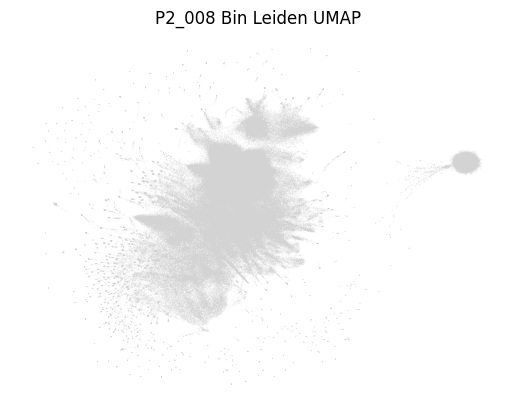

In [22]:
p2_008 = p2_008_adata.copy()
# Start with your full spatial data
p2_008 = p2_008_adata.copy()

# Preprocess
sc.pp.normalize_total(p2_008)
sc.pp.log1p(p2_008)


sc.pp.highly_variable_genes(p2_008, n_top_genes=2000)
p2_008 = p2_008[:, p2_008.var.highly_variable].copy()
sc.pp.scale(p2_008, max_value=10)
sc.tl.pca(p2_008)
sc.pp.neighbors(p2_008)
sc.tl.umap(p2_008)
sc.pl.umap(p2_008, title="P2_008 Bin Leiden UMAP", frameon=False)

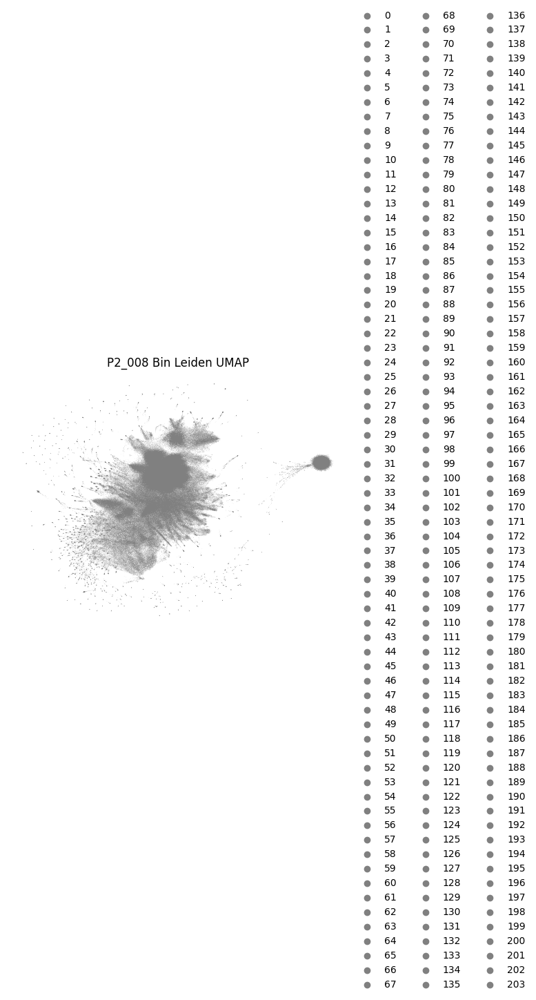

In [23]:
sc.tl.leiden(p2_008)
sc.pl.umap(p2_008, color="leiden", title="P2_008 Bin Leiden UMAP", frameon=False)

AnnData object with n_obs × n_vars = 590650 × 611
    obs: 'biosample_id', 'donor_id', 'SpecimenType', 'TissueSource', 'ProcessingMethod', 'PatientTypeID', 'sex', 'Site', 'Grade', 'TumorStage', 'LymphNodeStatus', 'MMRStatusTumor', 'MMRMLH1Tumor', 'qc_geneCount', 'qc_logMappedReads', 'qc_meanReadsPerUmi', 'qc_totalReads', 'qc_logUmiCount', 'qc_bcSwapFraction', 'qc_geneSatFraction', 'qc_seqDupEst', 'qc_umiSatFraction', 'qc_emptyDropPval', 'qc_mitoFraction', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'total_counts', 'log1p_total_counts', 'Sample ID', 'PhenoGraph_clusters', 'Patient', 'Primary Site', 'Sample Type', 'Treatment', 'Cell Compartment', 'PhenoGraph Classification', 'Cell State', 'P(ISC)', 'P(Squamous)', 'P(Fetal)', 'P(Absorptive)', 'P(Proliferative)', 'P(Neuroendocrine)', 'P(Secretory)', 'organoid', 'condition', 'Module Osteoblast Sco

2025-07-30 03:06:45,842 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2025-07-30 03:07:20,136 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2025-07-30 03:07:21,640 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2025-07-30 03:11:27,913 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2025-07-30 03:15:34,331 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2025-07-30 03:19:40,577 - harmonypy - INFO - Iteration 4 of 10
Iteration 4 of 10
2025-07-30 03:23:46,956 - harmonypy - INFO - Converged after 4 iterations
Converged after 4 iterations
... storing 'predicted_ClusterFull' as categorical
... storing 'predicted_ClusterTop' as categorical
... storing 'predicted_ClusterMidway' as categorical


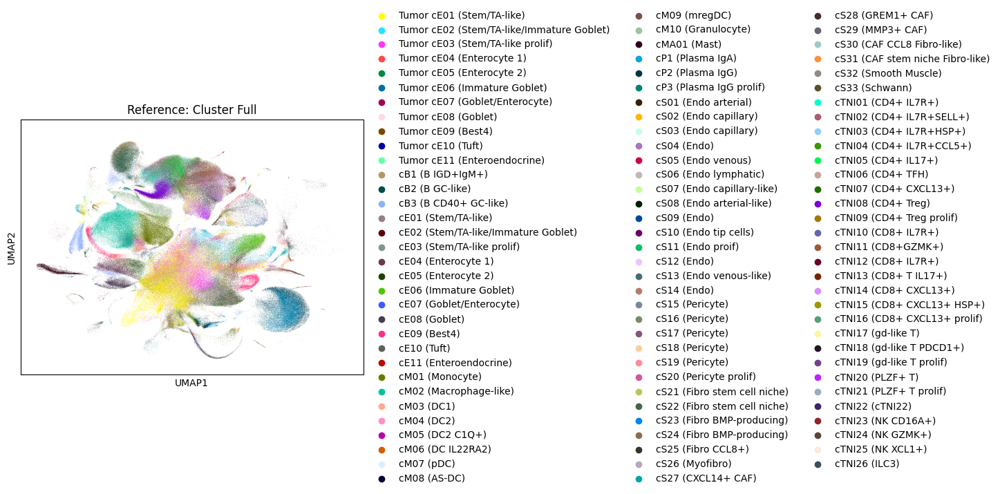

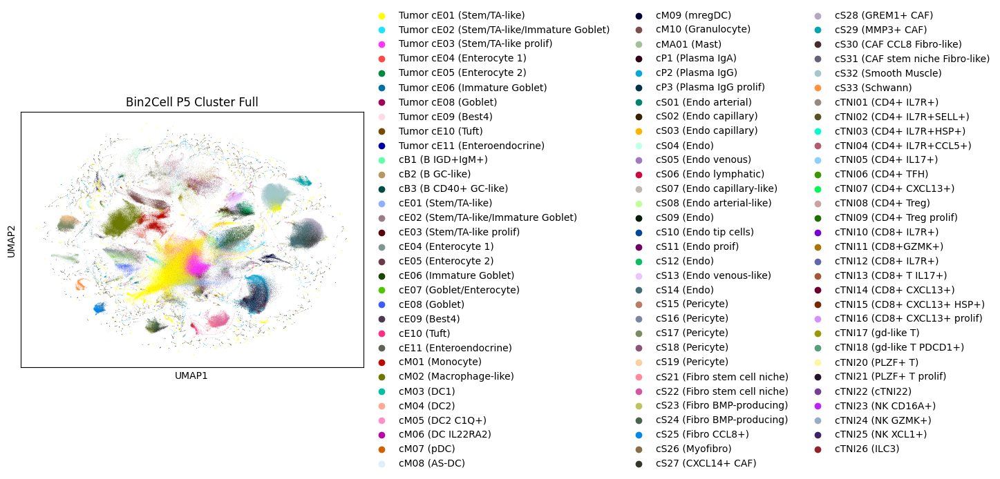

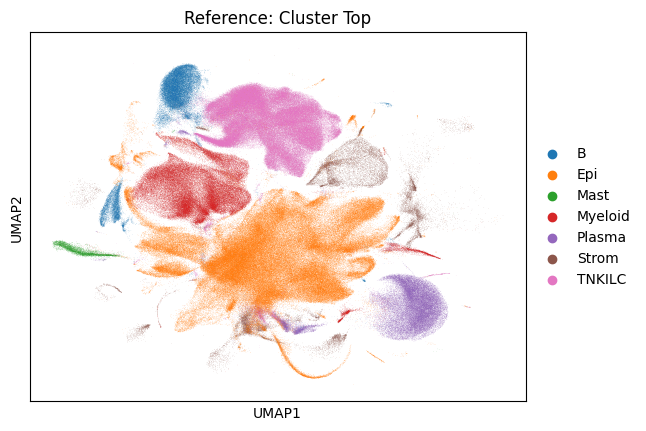

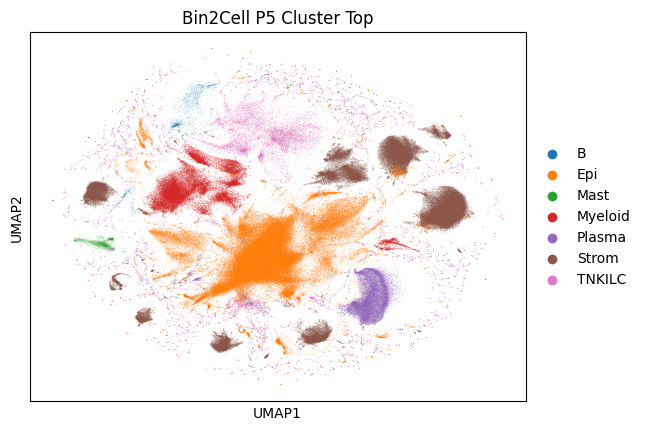

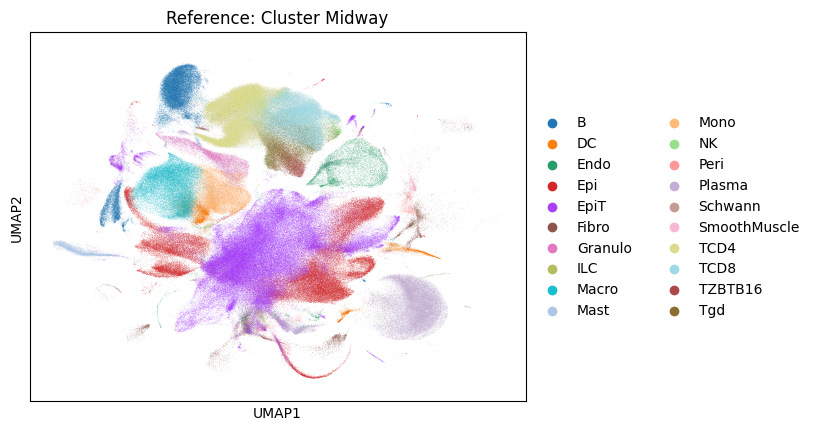

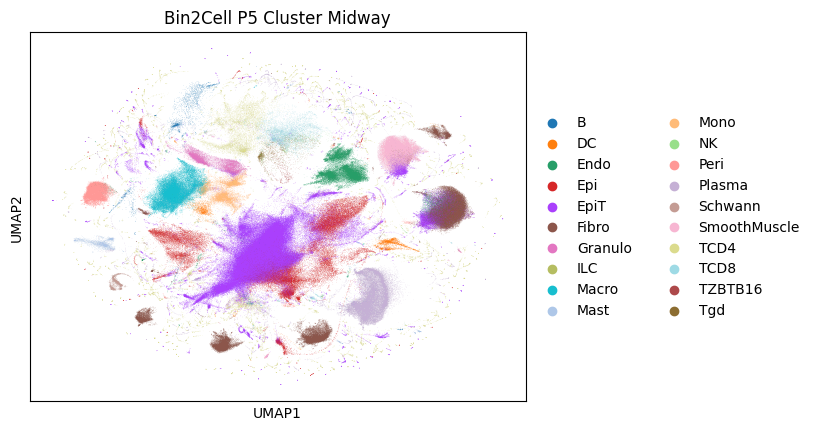

In [26]:
sc_adata = sc.read_h5ad("flex_pelka_moorman_harmony_donor_integrated.h5ad")

ref   = sc_adata.copy()
print(ref)
query = p2_008_adata.copy()

# Ensure unique var_names in both AnnData objects
ref.var_names_make_unique()
query.var_names_make_unique()

# Shared HVGs
if "highly_variable" in ref.var:
    hv_mask = ref.var["highly_variable"]
elif "highly_variable_rank" in ref.var:
    hv_mask = ~ref.var["highly_variable_rank"].isna()
else:
    hv_mask = np.ones(ref.n_vars, bool)

shared_hvg = ref.var_names[hv_mask].intersection(query.var_names)
ref = ref[:, shared_hvg].copy()
query = query[:, shared_hvg].copy()

# Normalize + scale query
sc.pp.normalize_total(query)
sc.pp.log1p(query)
sc.pp.scale(query)

# Combine datasets
combined_p2_008 = anndata.concat(
    [ref, query],
    label="source",
    keys=["ref", "query"],
    join="outer"
)

print(combined_p2_008.obs["source"].value_counts())

# PCA + Harmony integration
sc.tl.pca(combined_p2_008, n_comps=50, svd_solver="arpack")
sc.external.pp.harmony_integrate(combined_p2_008, key="source")

# Neighbors + UMAP
sc.pp.neighbors(combined_p2_008, use_rep="X_pca_harmony")
sc.tl.umap(combined_p2_008)

# Masks
ref_mask = combined_p2_008.obs["source"] == "ref"
query_mask = combined_p2_008.obs["source"] == "query"

# Label transfer for multiple annotations
label_keys = ["ClusterFull", "ClusterTop", "ClusterMidway"]

for label in label_keys:
    if label not in combined_p2_008.obs.columns:
        print(f"Label '{label}' not found in combined_p2_008.obs — skipping.")
        continue

    knn = KNeighborsClassifier(n_neighbors=15)
    knn.fit(combined_p2_008.obsm["X_pca_harmony"][ref_mask],
            combined_p2_008.obs.loc[ref_mask, label])

    combined_p2_008.obs.loc[query_mask, f"predicted_{label}"] = knn.predict(
        combined_p2_008.obsm["X_pca_harmony"][query_mask]
    )

# Slice after all predictions are complete
ref_h = combined_p2_008[ref_mask].copy()
query_h = combined_p2_008[query_mask].copy()

# Plot
import os

# Make directory to store figures if it doesn't exist
os.makedirs("figures", exist_ok=True)

# Plot individual UMAPs for reference and query with saving and custom titles
for label in label_keys:
    # Plot for reference
    ref_title = f"Reference: {label.replace('Cluster', 'Cluster ')}"
    ref_fig = sc.pl.umap(
        ref_h,
        color=label,
        title=ref_title,
        show=False,
        return_fig=True
    )
    ref_fig.savefig(f"figures/umap_reference_{label}.png")
    ref_fig.show()

    # Plot for Bin2Cell
    pred_label = f"predicted_{label}"
    bin2cell_title = f"Bin2Cell P5 {label.replace('Cluster', 'Cluster ')}"
    query_fig = sc.pl.umap(
        query_h,
        color=pred_label,
        title=bin2cell_title,
        show=False,
        return_fig=True
    )
    query_fig.savefig(f"figures/umap_bin2cell_P2_{label}.png")
    query_fig.show()


Visium_008 P5 Leiden and Single Cell Integration

... storing 'feature_types' as categorical
... storing 'genome' as categorical


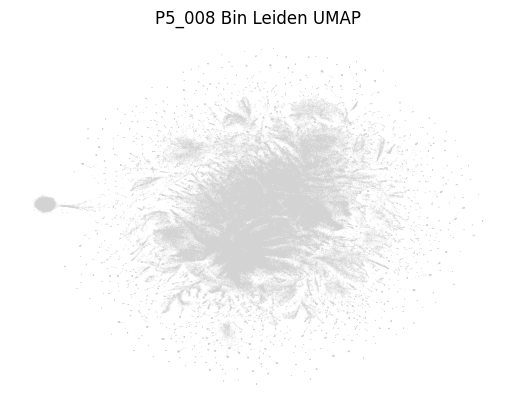

In [34]:
p5_008 = p5_008_adata.copy()
# Start with your full spatial data
p5_008 = p5_008_adata.copy()

# Preprocess
sc.pp.normalize_total(p5_008)
sc.pp.log1p(p5_008)


sc.pp.highly_variable_genes(p5_008, n_top_genes=2000)
p5_008 = p5_008[:, p5_008.var.highly_variable].copy()
sc.pp.scale(p5_008, max_value=10)
sc.tl.pca(p5_008)
sc.pp.neighbors(p5_008)
sc.tl.umap(p5_008)
sc.pl.umap(p5_008, title="P5_008 Bin Leiden UMAP", frameon=False)

IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out


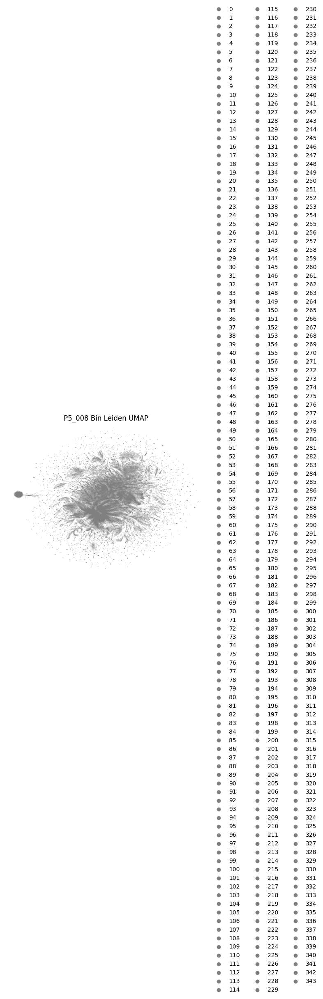

In [37]:
sc.tl.leiden(p5_008)
sc.pl.umap(p5_008, color="leiden", title="P5_008 Bin Leiden UMAP", frameon=False)

In [38]:
p5_008.write("p5_008_with_leiden.h5ad")

AnnData object with n_obs × n_vars = 590650 × 611
    obs: 'biosample_id', 'donor_id', 'SpecimenType', 'TissueSource', 'ProcessingMethod', 'PatientTypeID', 'sex', 'Site', 'Grade', 'TumorStage', 'LymphNodeStatus', 'MMRStatusTumor', 'MMRMLH1Tumor', 'qc_geneCount', 'qc_logMappedReads', 'qc_meanReadsPerUmi', 'qc_totalReads', 'qc_logUmiCount', 'qc_bcSwapFraction', 'qc_geneSatFraction', 'qc_seqDupEst', 'qc_umiSatFraction', 'qc_emptyDropPval', 'qc_mitoFraction', 'species', 'species__ontology_label', 'disease', 'disease__ontology_label', 'organ', 'organ__ontology_label', 'library_preparation_protocol', 'library_preparation_protocol__ontology_label', 'total_counts', 'log1p_total_counts', 'Sample ID', 'PhenoGraph_clusters', 'Patient', 'Primary Site', 'Sample Type', 'Treatment', 'Cell Compartment', 'PhenoGraph Classification', 'Cell State', 'P(ISC)', 'P(Squamous)', 'P(Fetal)', 'P(Absorptive)', 'P(Proliferative)', 'P(Neuroendocrine)', 'P(Secretory)', 'organoid', 'condition', 'Module Osteoblast Sco

2025-07-30 10:38:38,139 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
Computing initial centroids with sklearn.KMeans...
2025-07-30 10:39:12,326 - harmonypy - INFO - sklearn.KMeans initialization complete.
sklearn.KMeans initialization complete.
2025-07-30 10:39:13,762 - harmonypy - INFO - Iteration 1 of 10
Iteration 1 of 10
2025-07-30 10:42:43,532 - harmonypy - INFO - Iteration 2 of 10
Iteration 2 of 10
2025-07-30 10:46:34,833 - harmonypy - INFO - Iteration 3 of 10
Iteration 3 of 10
2025-07-30 10:50:40,571 - harmonypy - INFO - Iteration 4 of 10
Iteration 4 of 10
2025-07-30 10:54:10,586 - harmonypy - INFO - Iteration 5 of 10
Iteration 5 of 10
2025-07-30 10:57:55,898 - harmonypy - INFO - Iteration 6 of 10
Iteration 6 of 10
2025-07-30 11:00:15,232 - harmonypy - INFO - Converged after 6 iterations
Converged after 6 iterations
... storing 'predicted_ClusterFull' as categorical
... storing 'predicted_ClusterTop' as categorical
... storing 'predicted_ClusterMidway' 

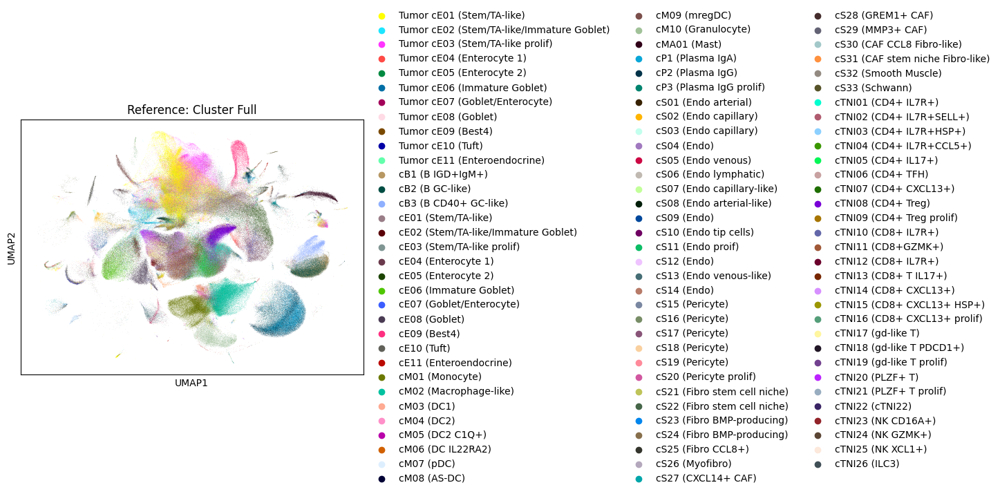

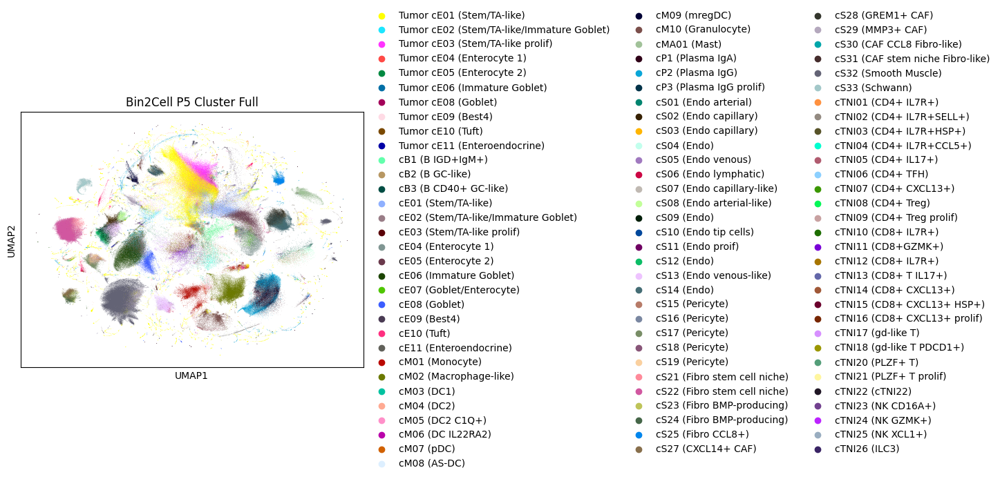

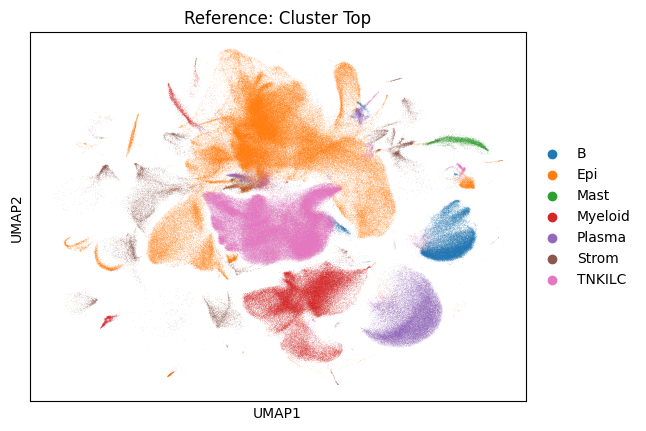

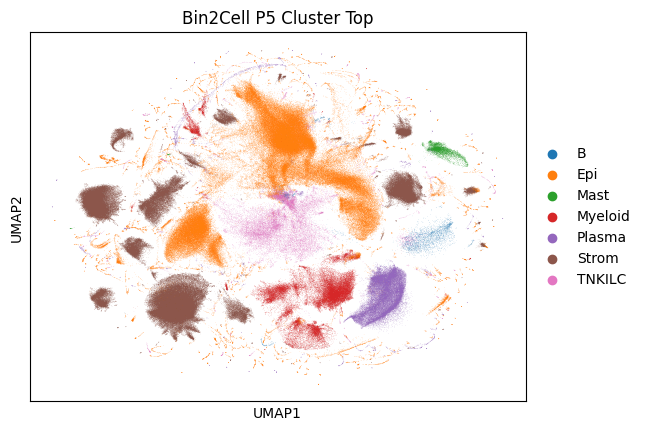

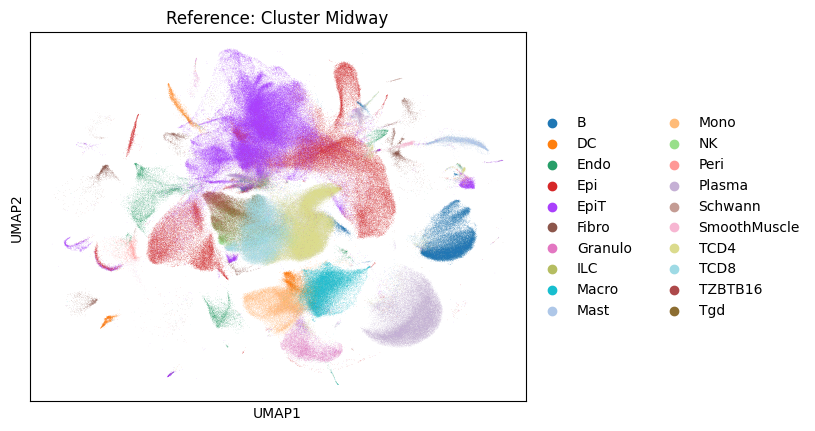

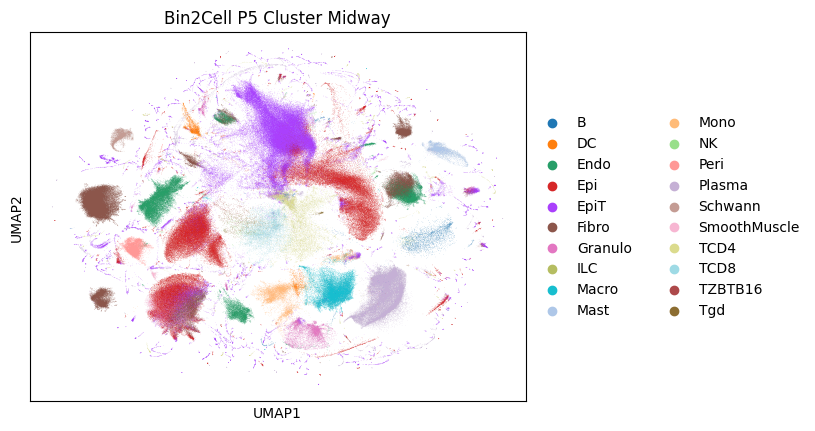

In [5]:
sc_adata = sc.read_h5ad("flex_pelka_moorman_harmony_donor_integrated.h5ad")
from sklearn.neighbors import KNeighborsClassifier  
ref   = sc_adata.copy()
print(ref)
query = p5_008_adata.copy()

# Ensure unique var_names in both AnnData objects
ref.var_names_make_unique()
query.var_names_make_unique()


# Shared HVGs
if "highly_variable" in ref.var:
    hv_mask = ref.var["highly_variable"]
elif "highly_variable_rank" in ref.var:
    hv_mask = ~ref.var["highly_variable_rank"].isna()
else:
    hv_mask = np.ones(ref.n_vars, bool)

shared_hvg = ref.var_names[hv_mask].intersection(query.var_names)
ref = ref[:, shared_hvg].copy()
query = query[:, shared_hvg].copy()

# Normalize + scale query
sc.pp.normalize_total(query)
sc.pp.log1p(query)
sc.pp.scale(query)

# Combine datasets
combined_p5_008 = anndata.concat(
    [ref, query],
    label="source",
    keys=["ref", "query"],
    join="outer"
)

print(combined_p5_008.obs["source"].value_counts())

# PCA + Harmony integration
sc.tl.pca(combined_p5_008, n_comps=50, svd_solver="arpack")
sc.external.pp.harmony_integrate(combined_p5_008, key="source")

# Neighbors + UMAP
sc.pp.neighbors(combined_p5_008, use_rep="X_pca_harmony")
sc.tl.umap(combined_p5_008)

# Masks
ref_mask = combined_p5_008.obs["source"] == "ref"
query_mask = combined_p5_008.obs["source"] == "query"

# Label transfer for multiple annotations
label_keys = ["ClusterFull", "ClusterTop", "ClusterMidway"]

for label in label_keys:
    if label not in combined_p5_008.obs.columns:
        print(f"Label '{label}' not found in combined_p5_008.obs — skipping.")
        continue

    knn = KNeighborsClassifier(n_neighbors=15)
    knn.fit(combined_p5_008.obsm["X_pca_harmony"][ref_mask],
            combined_p5_008.obs.loc[ref_mask, label])

    combined_p5_008.obs.loc[query_mask, f"predicted_{label}"] = knn.predict(
        combined_p5_008.obsm["X_pca_harmony"][query_mask]
    )

# Slice after all predictions are complete
ref_h = combined_p5_008[ref_mask].copy()
query_h = combined_p5_008[query_mask].copy()

# Plot
import os

# Make directory to store figures if it doesn't exist
os.makedirs("figures", exist_ok=True)

# Plot individual UMAPs for reference and query with saving and custom titles
for label in label_keys:
    # Plot for reference
    ref_title = f"Reference: {label.replace('Cluster', 'Cluster ')}"
    ref_fig = sc.pl.umap(
        ref_h,
        color=label,
        title=ref_title,
        show=False,
        return_fig=True
    )
    ref_fig.savefig(f"figures/umap_reference_{label}.png")
    ref_fig.show()

    # Plot for Bin2Cell
    pred_label = f"predicted_{label}"
    bin2cell_title = f"Bin2Cell P5 {label.replace('Cluster', 'Cluster ')}"
    query_fig = sc.pl.umap(
        query_h,
        color=pred_label,
        title=bin2cell_title,
        show=False,
        return_fig=True
    )
    query_fig.savefig(f"figures/umap_bin2cell_P2_{label}.png")
    query_fig.show()


In [7]:
combined_p5_008.write("combined_p5_008_integrated.h5ad")

In [8]:
import os
print("Saved to:", os.path.abspath("combined_p5_008_integrated.h5ad"))


Saved to: /gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation/combined_p5_008_integrated.h5ad


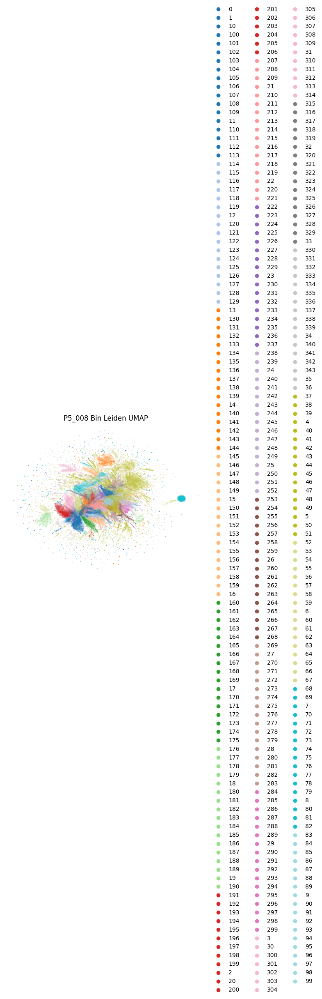

In [32]:
sc.pl.umap(p5_008_adata, color="leiden", title="P5_008 Bin Leiden UMAP", frameon=False)

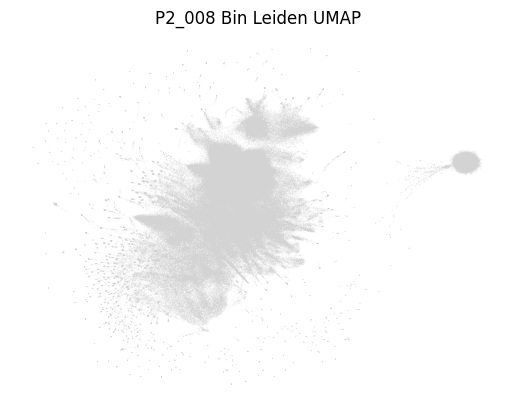

In [43]:
# Ensure Leiden column is categorical
p2_008_adata.obs["leiden"] = p2_008_adata.obs["leiden"].astype(str).astype("category")

# Now plot with proper coloring
sc.pl.umap(
    p2_008_adata,
    title="P2_008 Bin Leiden UMAP",
    frameon=False
)


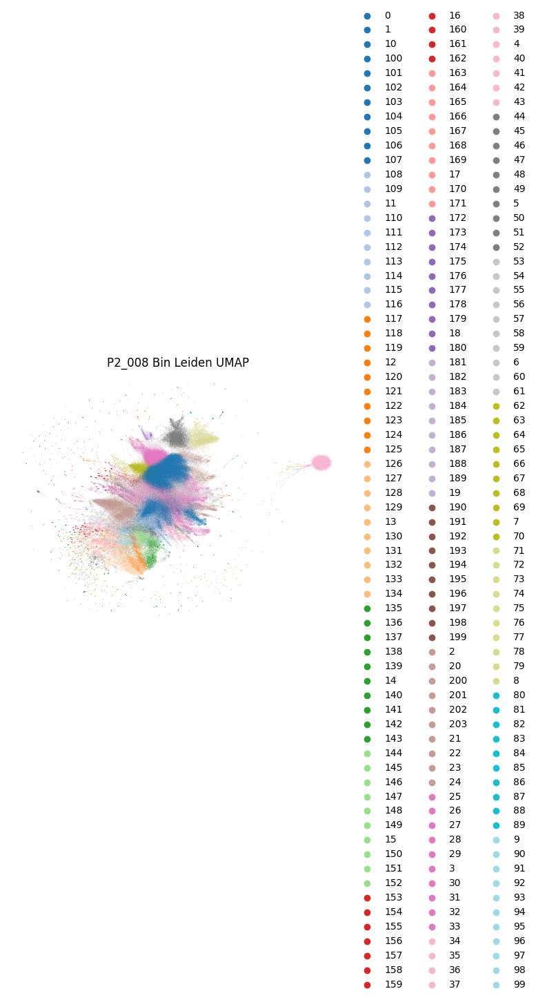

In [42]:
sc.pl.umap(
    p2_008_adata,
    color="leiden",
    title="P2_008 Bin Leiden UMAP",
    frameon=False
)

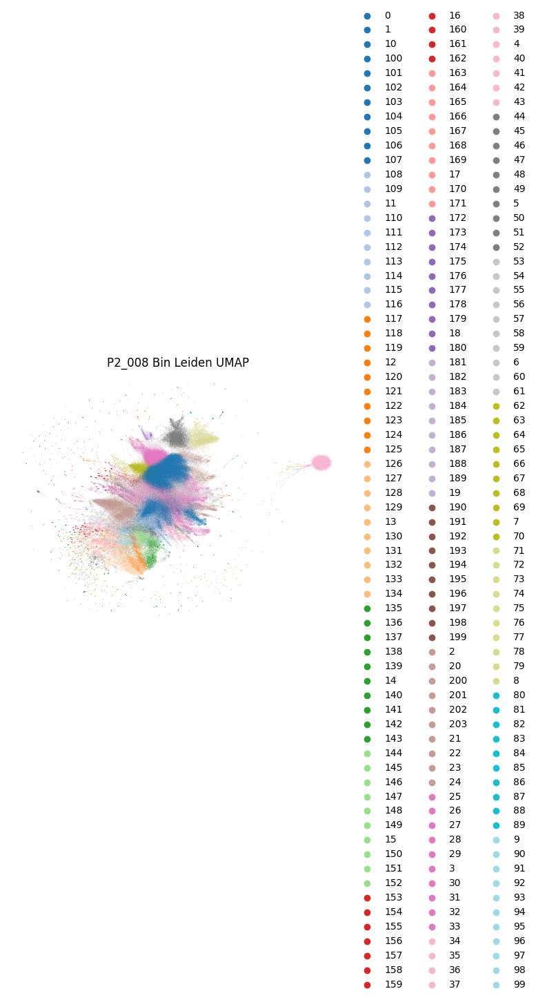

In [46]:
sc.pl.umap(p2_008_adata, color = 'leiden', title="P2_008 Bin Leiden UMAP", frameon=False)

In [67]:
import squidpy as sq
#Visium HD

smurf_p2 = sc.read_h5ad("/gpfs/commons/groups/innovation/jjoseph/smurf_results/smurf_p2_interactive_07_20/adata_sc_final.h5ad")


In [33]:
import os
print(os.getcwd())
os.listdir("07_30_clustering")


/gpfs/commons/groups/innovation/jjoseph/data/single_cell_Presenation


['p2_leiden_clustered.h5ad',
 'combined_p2_008_harmony_knn_labeled.h5ad',
 'p2_008_leiden_clustered.h5ad',
 'combined_p2_harmony_knn_labeled.h5ad',
 'p5_leiden_clustered.h5ad',
 'combined_p5_harmony_knn_labeled.h5ad']

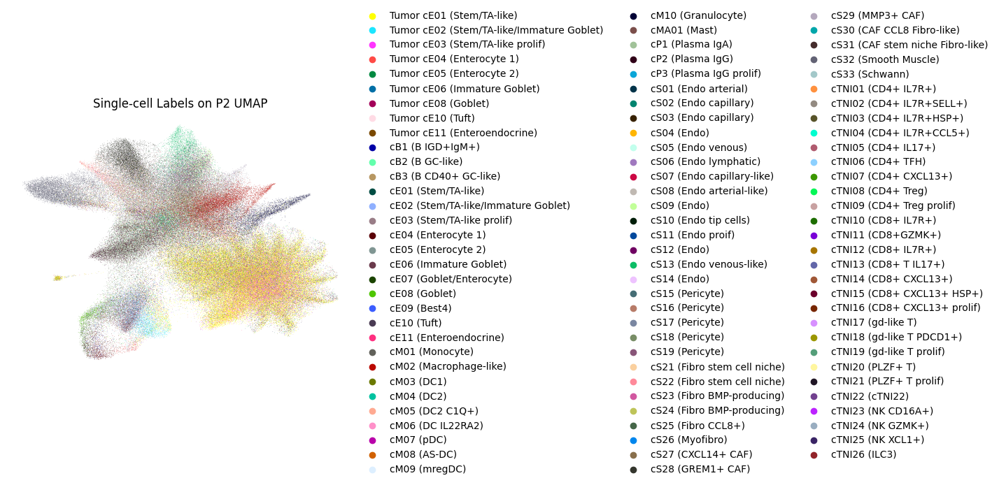

In [44]:
# Plot match 

p2_with_labels = combined_p2[combined_p2.obs["source"] == "query"].copy()
adata_p2.obs["predicted_ClusterFull"] = p2_with_labels.obs["predicted_ClusterFull"].values
sc.pl.umap(
    adata_p2,
    color="predicted_ClusterFull",
    title="Single-cell Labels on P2 UMAP",
    frameon=False
)


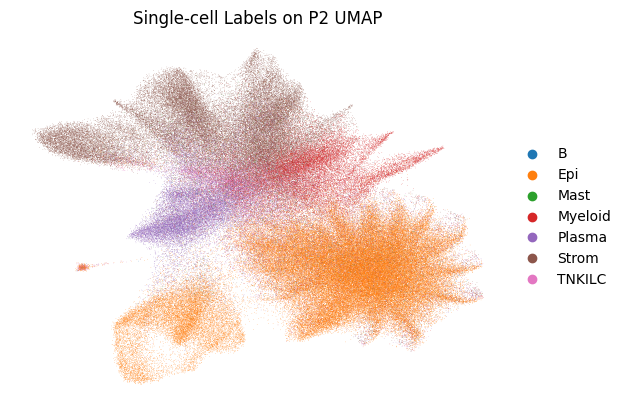

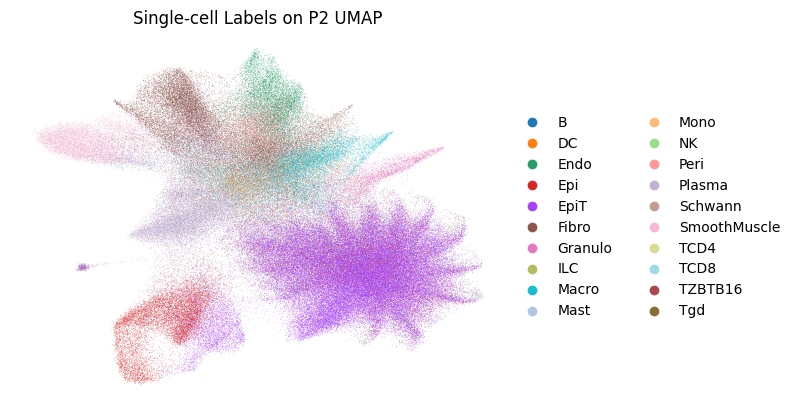

In [53]:
# Plot match for P2 

p2_with_labels = combined_p2[combined_p2.obs["source"] == "query"].copy()
adata_p2.obs["predicted_ClusterFull"] = p2_with_labels.obs["predicted_ClusterFull"].values
sc.pl.umap(
    adata_p2,
    color="predicted_ClusterTop",
    title="Single-cell Labels on P2 UMAP",
    frameon=False
)

# Plot match 

p2_with_labels = combined_p2[combined_p2.obs["source"] == "query"].copy()
adata_p2.obs["predicted_ClusterFull"] = p2_with_labels.obs["predicted_ClusterFull"].values
sc.pl.umap(
    adata_p2,
    color="predicted_ClusterMidway",
    title="Single-cell Labels on P2 UMAP",
    frameon=False
)


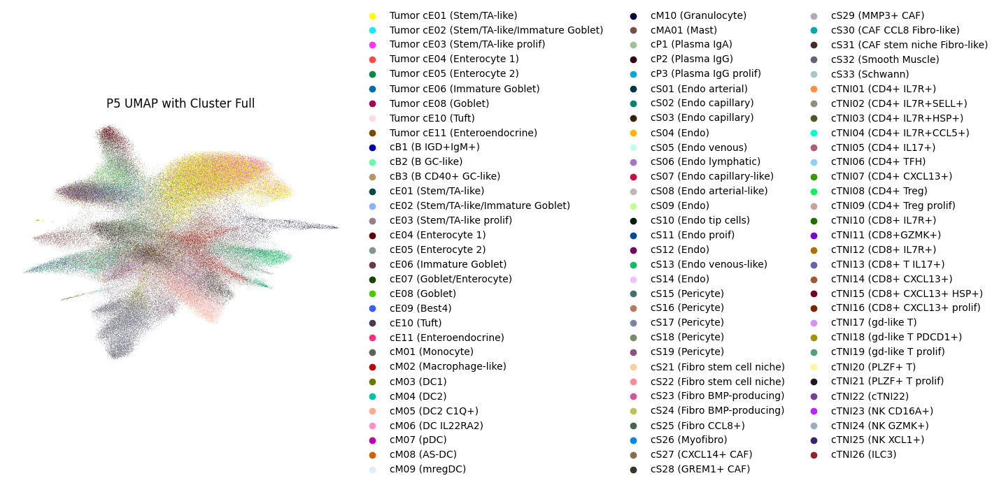

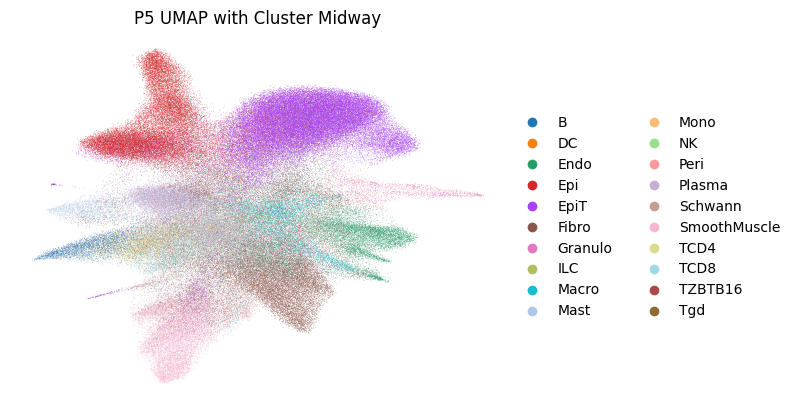

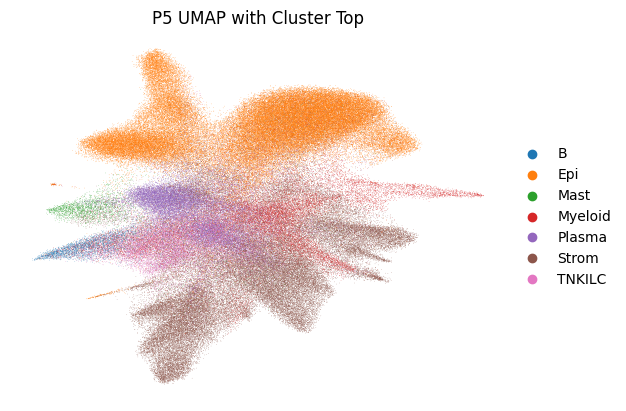

In [65]:
p5_adata_bin2cell.obsm["X_umap"] = p5_adata.obsm["X_umap"]
label_keys = ["predicted_ClusterFull", "predicted_ClusterMidway", "predicted_ClusterTop"]

for label in label_keys:
    if label in p5_adata_bin2cell.obs.columns:
        sc.pl.umap(
            p5_adata_bin2cell,
            color=label,
            title=f"P5 UMAP with {label.replace('predicted_', '').replace('Cluster', 'Cluster ')}",
            frameon=False,
            legend_loc="right margin"
        )


In [66]:
# From combined_p2_008 → p2_008
query_mask = combined_p2_008.obs["source"] == "query"
p2_labels = combined_p2_008[query_mask]

# Transfer predicted labels
for label in ["predicted_ClusterFull", "predicted_ClusterMidway", "predicted_ClusterTop"]:
    if label in p2_labels.obs.columns:
        p2_008.obs[label] = p2_labels.obs[label].reindex(p2_008.obs_names)


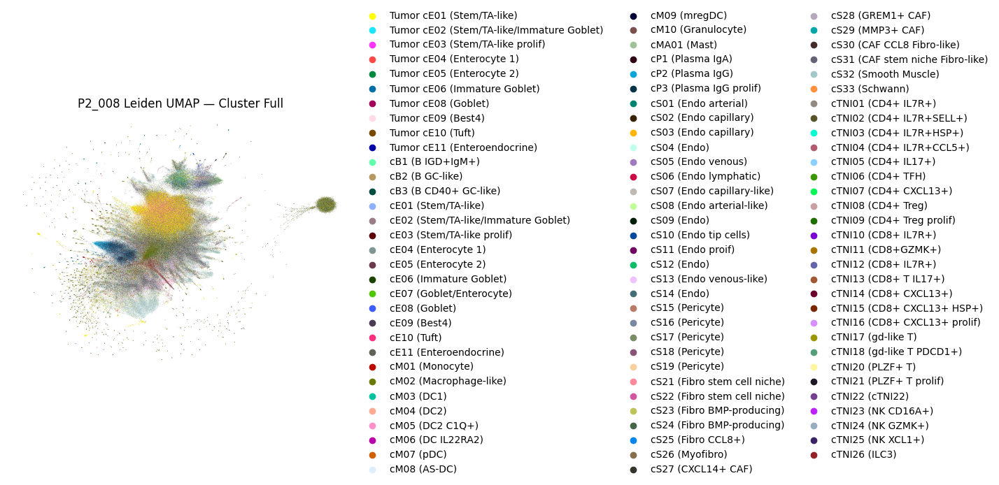

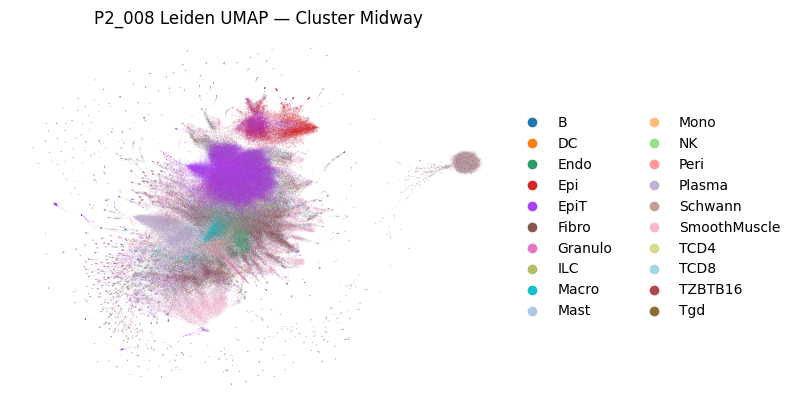

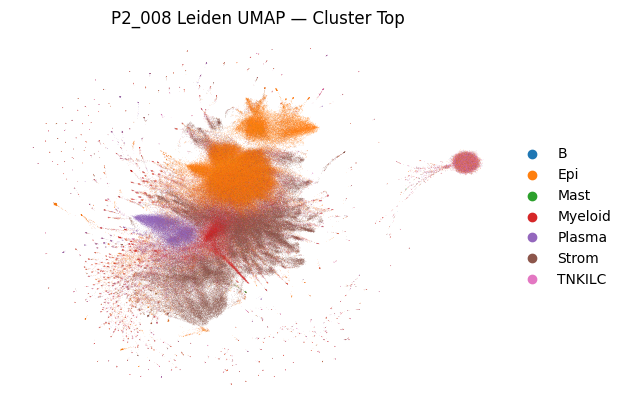

In [68]:
for label in ["predicted_ClusterFull", "predicted_ClusterMidway", "predicted_ClusterTop"]:
    if label in p2_008.obs.columns:
        sc.pl.umap(
            p2_008,
            color=label,
            title=f"P2_008 Leiden UMAP — {label.replace('predicted_', '').replace('Cluster', 'Cluster ')}",
            frameon=False,
            legend_loc="right margin"
        )
